# 2d Waveguide created by a line defect in a Photonic Crystal

In [2]:
import meep as mp
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

A photonic crystal is created from a periodic arrangement of cylinders made up of GaAs. A line defect is created at the center along the x axis. \
The length scale here is in units of micrometer

In [9]:
## Parameters and Geometry

resolution = 32
a = 1.0  #period of photonic crystal
r = 0.2*a  #radius of cylinder
n_rod = 3.94  #RI of GaAs
num_rows = 12 # number of rows on each side 

sx = 2*(a*num_rows + r*num_rows)
sy = 2*(a*num_rows + r*num_rows)
cell = mp.Vector3(sx, sy, 0)

geometry = []
for i in range(-num_rows, num_rows + 1):
    for j in range(-num_rows, num_rows + 1):
        if j != 0 : #exclude the center when creating the periodic structure  
            geometry.append(mp.Cylinder(radius=r, height=mp.inf,
                                        material=mp.Medium(index=n_rod),
                                        center=mp.Vector3(i * a, j * a)))

In [4]:
# Define Gaussian impulse source 

wvl = 1.3 
fcen = 1/wvl
df = 0.2*fcen
sources = [mp.Source(mp.GaussianSource(fcen, fwidth=df),
                     component=mp.Ez,
                     center=mp.Vector3(-9, 0),
                     size=mp.Vector3(0, 1, 0))]

In [5]:
# Absorbing boundary condition
pml_layers = [mp.PML(1.0)]

In [7]:
# Define simulation

sim = mp.Simulation(
    cell_size=cell,
    boundary_layers=pml_layers,
    geometry=geometry,
    sources=sources,
    resolution=resolution,
)

     cylinder, center = (-12,-12,0)
          radius 0.2, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (15.5236,15.5236,15.5236)
     cylinder, center = (-12,-11,0)
          radius 0.2, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (15.5236,15.5236,15.5236)
     cylinder, center = (-12,-10,0)
          radius 0.2, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (15.5236,15.5236,15.5236)
     cylinder, center = (-12,-9,0)
          radius 0.2, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (15.5236,15.5236,15.5236)
     cylinder, center = (-12,-8,0)
          radius 0.2, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (15.5236,15.5236,15.5236)
     cylinder, center = (-12,-7,0)
          radius 0.2, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (15.5236,15.5236,15.5236)
     cylinder, center = (-12,-6

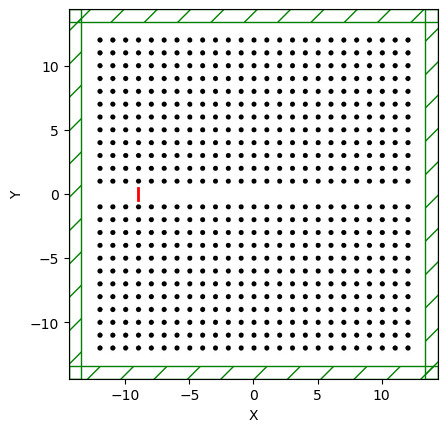

In [12]:
# Visualise the simulation domain

sim.plot2D(output_plane=mp.Volume(center=mp.Vector3(0,0,0),
                                  size=mp.Vector3(cell.x, cell.y, 0)));

In [8]:
# To collect Field data at regular intercals in time

frames = []

def save_field(sim):
    field_data = sim.get_array(center=mp.Vector3(), size=cell, component=mp.Ez)
    frames.append(np.copy(field_data))

In [10]:
# run simulation and take snapshots every 5 time units
sim.run(mp.at_every(2, save_field), until=100)

-----------
Initializing structure...
time for choose_chunkdivision = 0.00850105 s
Working in 2D dimensions.
Computational cell is 28.8125 x 28.8125 x 0 with resolution 32
     cylinder, center = (-12,-12,0)
          radius 0.2, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (15.5236,15.5236,15.5236)
     cylinder, center = (-12,-11,0)
          radius 0.2, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (15.5236,15.5236,15.5236)
     cylinder, center = (-12,-10,0)
          radius 0.2, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (15.5236,15.5236,15.5236)
     cylinder, center = (-12,-9,0)
          radius 0.2, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (15.5236,15.5236,15.5236)
     cylinder, center = (-12,-8,0)
          radius 0.2, height 1e+20, axis (0, 0, 1)
          dielectric constant epsilon diagonal = (15.5236,15.5236,15.5236)
     cylinder, cente

In [21]:
#  Create animation

E_data = sim.get_array(center=mp.Vector3(), size=cell, component=mp.Dielectric)

fig, ax = plt.subplots(dpi=150, figsize=(5,5))
ax.imshow(np.rot90(E_data), cmap="binary", alpha=0.4,
          extent=[-sx/2, sx/2, -sy/2, sy/2])

field_im = ax.imshow(np.rot90(frames[0]), cmap="RdBu", alpha=0.5,
                     extent=[-sx/2, sx/2, -sy/2, sy/2], vmin=-1, vmax=1)
ax.set_title("Ez field evolution in PhC waveguide")
ax.set_xlabel(r'x [$\mathrm{\mu m}$]')
ax.set_ylabel(r'y [$\mathrm{\mu m}$]')

def animate(i):
    field_im.set_array(np.rot90(frames[i]))
    return [field_im]

ani = animation.FuncAnimation(fig, animate, frames=len(frames), interval=100, blit=True)

plt.close(fig)  #prevent duplicate static plot
HTML(ani.to_jshtml())

In [22]:
# Save animation
ani.save("phc_waveguide.mp4", writer="ffmpeg", fps=20, dpi=150)
ani.save("phc_waveguide.gif", writer="pillow", fps=20)